# Verkehrsunfälle - Views erstellen

In [1]:
import numpy as np

import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

!pip install geopy  
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

!pip install matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use('ggplot')

!pip install folium
import folium # plotting library
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster


# 1) Verkehrsunfälle

## 1.1) Datensatz einlesen

In [2]:
df_verkehrsunfaelle_2020 = pd.read_csv('./data/verkehrsunfaelle_2020_mit_quartier_kreis.csv')

In [3]:
df_verkehrsunfaelle_2020.head()

,AccidentUID,Quartier,AccidentType,AccidentType_de,AccidentSeverityCategory,AccidentSeverityCategory_de,AccidentInvolvingPedestrian,AccidentInvolvingBicycle,AccidentInvolvingMotorcycle,RoadType,RoadType_de,AccidentLocation_CHLV95_E,AccidentLocation_CHLV95_N,CantonCode,MunicipalityCode,AccidentYear,AccidentMonth,AccidentMonth_de,AccidentWeekDay,AccidentWeekDay_de,AccidentHour,AccidentHour_text,AccidentLocation_WGS84_E,AccidentLocation_WGS84_N,Kreis,Jahreszeit,ZeitKategorie
0,9CCA869C93E0DA25E05329B9D80AF2FB,8057,at0,Schleuder- oder Selbstunfall,as3,Unfall mit Leichtverletzten,False,True,False,rt433,Nebenstrasse,2683236,1249583,ZH,261,2020,1,Januar,aw403,Mittwoch,4.0,04h-05h,47.391814,8.541109,Kreis 6,Winter,Nacht
1,9E7139B16D85C771E05329B9D80A926E,8090,at8,Fussgängerunfall,as3,Unfall mit Leichtverletzten,True,False,False,rt433,Nebenstrasse,2682964,1248220,ZH,261,2020,1,Januar,aw403,Mittwoch,5.0,05h-06h,47.379590,8.537254,Kreis 5,Winter,Nacht
2,9E7139B167FDC771E05329B9D80A926E,8021,at1,Überholunfall oder Fahrstreifenwechsel,as4,Unfall mit Sachschaden,False,True,False,rt433,Nebenstrasse,2682811,1247444,ZH,261,2020,1,Januar,aw403,Mittwoch,5.0,05h-06h,47.372631,8.535085,Kreis 1,Winter,Nacht
3,A235C3252D0E9903E05328B9D80AFCE5,8048,at0,Schleuder- oder Selbstunfall,as4,Unfall mit Sachschaden,False,False,False,rt433,Nebenstrasse,2679166,1248512,ZH,261,2020,1,Januar,aw403,Mittwoch,12.0,12h-13h,47.382684,8.487018,Kreis 9,Winter,Morgen
4,9EC134679786BAC8E05329B9D80A310C,8004,at7,Parkierunfall,as4,Unfall mit Sachschaden,False,False,False,rt433,Nebenstrasse,2682395,1248019,ZH,261,2020,1,Januar,aw403,Mittwoch,14.0,14h-15h,47.377854,8.529684,Kreis 4,Winter,Nachmittag


## 1.2) Allgemeine Daten übersicht

### 1.2.1) Anzahl Unfälle nach Schweregrad

In [4]:
# Anzahl Unfälle nach schwere des unfalles
df_verkehrsunfaelle_2020['AccidentSeverityCategory_de'].value_counts().to_frame()

,AccidentSeverityCategory_de
Unfall mit Sachschaden,4019
Unfall mit Leichtverletzten,1087
Unfall mit Schwerverletzten,180
Unfall mit Getöteten,5


### 1.2.2) Anzahl Unfälle nach Unfalltyp

In [5]:
# Anzahl Unfälle pro Unfallkategorie
df_verkehrsunfaelle_2020['AccidentType_de'].value_counts().to_frame()

,AccidentType_de
Schleuder- oder Selbstunfall,1462
Parkierunfall,1197
Auffahrunfall,967
Überholunfall oder Fahrstreifenwechsel,621
Abbiegeunfall,296
Einbiegeunfall,252
Überqueren der Fahrbahn,199
Fussgängerunfall,180
Frontalkollision,67
Tierunfall,25


### 1.2.3) Barchart - Anzahl Unfälle nach Unfalltyp

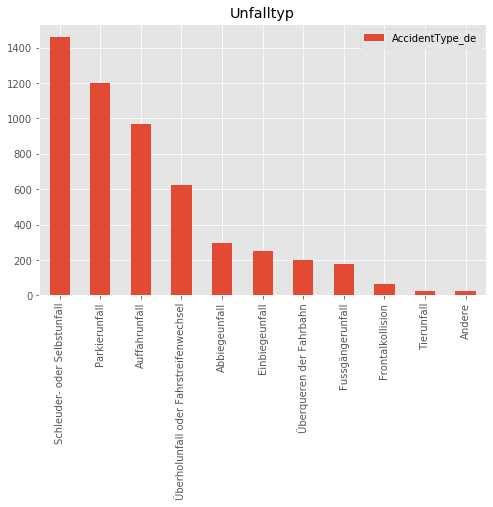

In [6]:
df_verkehrsunfaelle_2020['AccidentType_de'].value_counts().to_frame().plot(kind='bar', figsize=(8, 5))

plt.title('Unfalltyp') 
plt.show()

### 1.2.4) Barchart - Anzahl Unfälle pro Monat

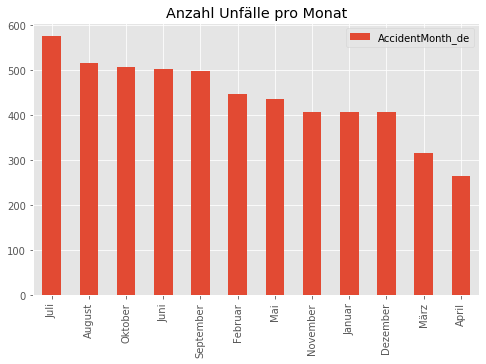

In [7]:
df_verkehrsunfaelle_2020['AccidentMonth_de'].value_counts().to_frame().plot(kind='bar', figsize=(8, 5))

plt.title('Anzahl Unfälle pro Monat') 
plt.show()

### 1.2.5) Barchart - Anzahl Unfälle pro Wochentag

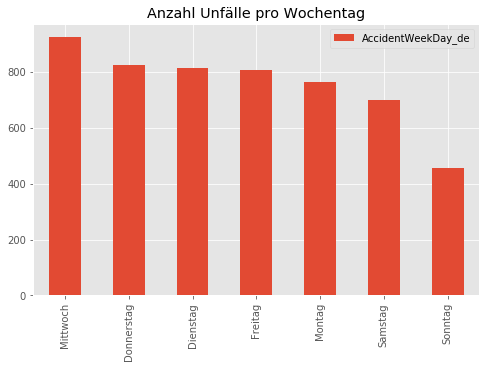

In [8]:
df_verkehrsunfaelle_2020['AccidentWeekDay_de'].value_counts().to_frame().plot(kind='bar', figsize=(8, 5))

plt.title('Anzahl Unfälle pro Wochentag') 
plt.show()

### 1.2.6) Barchart - Anzahl Unfälle pro Stunde

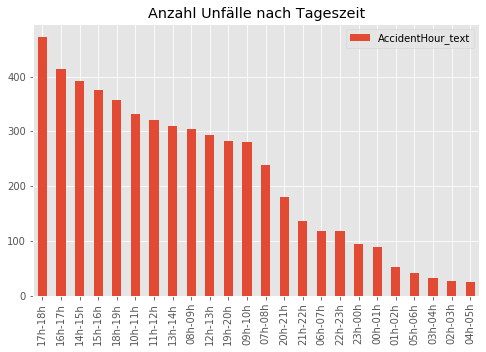

In [9]:
df_verkehrsunfaelle_2020['AccidentHour_text'].value_counts().to_frame().plot(kind='bar', figsize=(8, 5))

plt.title('Anzahl Unfälle nach Tageszeit') 
plt.show()

### 1.2.7) Anzahl Unfälle - Motorräder / Velo / Fussgänger

In [10]:
# Anzahl unfälle mit Motorräder
df_verkehrsunfaelle_2020['AccidentInvolvingMotorcycle'].sum()

343

In [11]:
# Anzahl unfälle mit Velobeteiligung
df_verkehrsunfaelle_2020['AccidentInvolvingBicycle'].sum()

761

In [12]:
# Anzahl unfälle mit Fussgänger
df_verkehrsunfaelle_2020['AccidentInvolvingPedestrian'].sum()

183

### 1.2.8) Pie Chart - Schweregrad des Unfalles

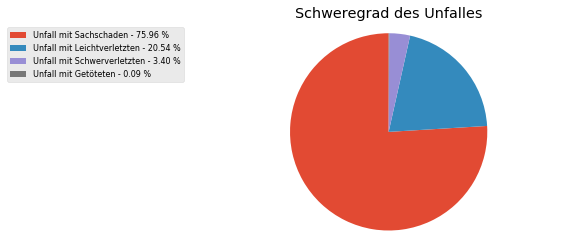

In [84]:
df_temp = df_verkehrsunfaelle_2020['AccidentSeverityCategory_de'].value_counts().to_frame()

y = df_temp['AccidentSeverityCategory_de']

patches, texts = plt.pie(y, startangle=90, radius=1.2)

percent = 100.*y/y.sum()
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(df_temp.index, percent)]

plt.title('Schweregrad des Unfalles')
plt.axis('equal') 
plt.legend(patches, labels, loc='best', bbox_to_anchor=(-0.1, 1.),
           fontsize=8)
plt.show()

### 1.2.9) Anzahl Unfälle pro Monat - Velo / Motorrad / Fussgänger

In [32]:
df_temp = df_verkehrsunfaelle_2020.groupby(['AccidentMonth_de', 'AccidentInvolvingBicycle']).size().to_frame()
df_temp = df_temp[df_temp.index.isin([True], level=1)]

In [33]:
df_temp

,,0
AccidentMonth_de,AccidentInvolvingBicycle,
April,True,45
August,True,87
Dezember,True,27
Februar,True,47
Januar,True,36
Juli,True,116
Juni,True,92
Mai,True,76
März,True,30


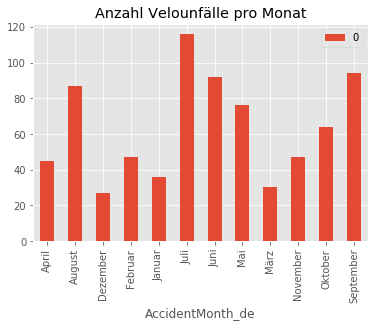

In [36]:
df_temp = df_temp.droplevel('AccidentInvolvingBicycle')
df_temp.plot(kind="bar")

plt.title('Anzahl Velounfälle pro Monat') 
plt.show()

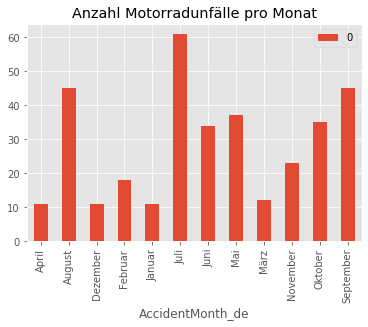

In [37]:
df_temp = df_verkehrsunfaelle_2020.groupby(['AccidentMonth_de', 'AccidentInvolvingMotorcycle']).size().to_frame()
df_temp = df_temp[df_temp.index.isin([True], level=1)]

df_temp = df_temp.droplevel('AccidentInvolvingMotorcycle')
df_temp.plot(kind="bar")
plt.title('Anzahl Motorradunfälle pro Monat') 
plt.show()

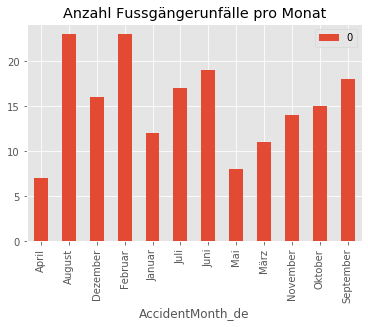

In [38]:
df_temp = df_verkehrsunfaelle_2020.groupby(['AccidentMonth_de', 'AccidentInvolvingPedestrian']).size().to_frame()
df_temp = df_temp[df_temp.index.isin([True], level=1)]

df_temp = df_temp.droplevel('AccidentInvolvingPedestrian')
df_temp.plot(kind="bar")
plt.title('Anzahl Fussgängerunfälle pro Monat') 
plt.show()

### 1.2.10) Anzahl Unfälle nach Tageszeit

In [19]:
# Anzahl Unfälle nach Tageszeit
df_verkehrsunfaelle_2020['ZeitKategorie'].value_counts().to_frame()

,ZeitKategorie
Rushhour_Abend,1524
Nachmittag,1077
Morgen,947
Rushhour_Morgen,943
Abend,531
Nacht,269


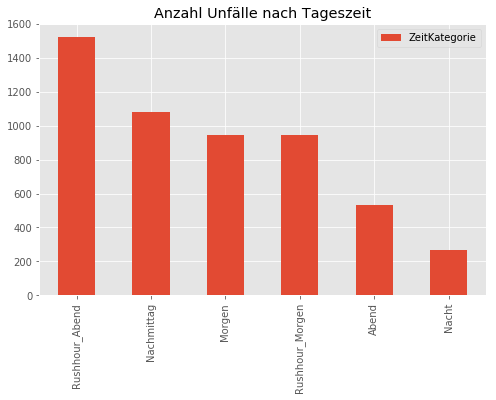

In [20]:
df_verkehrsunfaelle_2020['ZeitKategorie'].value_counts().to_frame().plot(kind='bar', figsize=(8, 5))

plt.title('Anzahl Unfälle nach Tageszeit') 
plt.show()

### 1.2.11) Anzahl Unfälle nach Jahreszeit

In [21]:
# Anzahl Unfälle nach Jahreszeit
df_verkehrsunfaelle_2020['Jahreszeit'].value_counts().to_frame()

,Jahreszeit
Sommer,1595
Herbst,1415
Winter,1264
Frühling,1017


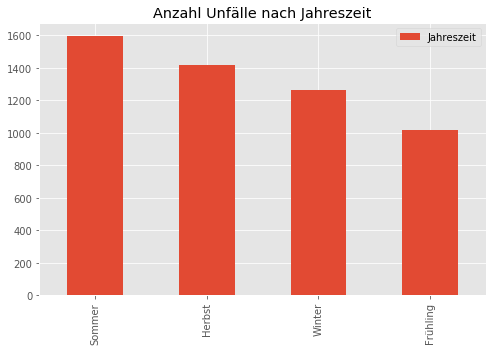

In [22]:
df_verkehrsunfaelle_2020['Jahreszeit'].value_counts().to_frame().plot(kind='bar', figsize=(8, 5))

plt.title('Anzahl Unfälle nach Jahreszeit') 
plt.show()

## 1.3) Map plots

### 1.3.1) Map - Alle Unfälle

In [39]:
# Farbgruppe nach Unfalltyp
out_lst_grpType = df_verkehrsunfaelle_2020.AccidentType.unique()
out_df_grpType = pd.DataFrame(out_lst_grpType) 
out_df_grpType = out_df_grpType.rename(columns={0: "AccidentType"})
out_df_grpType['colorGrp'] = out_df_grpType.apply(lambda x : list(np.random.choice(range(256), size=3)), axis=1)

In [40]:
out_df_grpType.sort_values(by='AccidentType').head()

,AccidentType,colorGrp
0,at0,"[87, 202, 215]"
7,at00,"[140, 11, 185]"
2,at1,"[12, 40, 178]"
6,at2,"[216, 100, 125]"
9,at3,"[221, 228, 241]"


In [41]:
df_verkehrsunfaelle_2020 = pd.merge(df_verkehrsunfaelle_2020, out_df_grpType, on='AccidentType')

In [42]:
# Zürich lon, lat
latitude = 47.36667
longitude = 8.55

In [43]:
map_markets = folium.Map(location=[latitude, longitude], zoom_start=12)

for lat, lng, severity, types, colo in zip(df_verkehrsunfaelle_2020['AccidentLocation_WGS84_E'], df_verkehrsunfaelle_2020['AccidentLocation_WGS84_N'], df_verkehrsunfaelle_2020['AccidentSeverityCategory_de'], df_verkehrsunfaelle_2020['AccidentType_de'], df_verkehrsunfaelle_2020['colorGrp']):
            label = '{}, {}, {};{}'.format(severity, types, lat, lng)
            label = folium.Popup(label, parse_html=True)
            folium.CircleMarker(
                [lat, lng],
                radius=3,
                popup=label,
                color=f'#{int(colo[0]):02x}{int(colo[1]):02x}{int(colo[2]):02x}',
                fill=True,
                fill_color=f'#{int(colo[0]):02x}{int(colo[1]):02x}{int(colo[2]):02x}',
                fill_opacity=0.7,
                parse_html = False).add_to(map_markets) 
        
map_markets

### 1.3.2) Map - Velo Unfälle

In [52]:
def create_circleMarkerMap(df, latitude, longitude):
    map = folium.Map(location=[latitude, longitude], zoom_start=12)
    for lat, lng, colo in zip(df['AccidentLocation_WGS84_E'], df['AccidentLocation_WGS84_N'], df['colorGrp']):
            folium.CircleMarker(
                    [lat, lng],
                    radius=3,
                    fill=True,
                    fill_opacity=0.7,
                    parse_html = False).add_to(map)  
            
    return map

In [53]:
df_bicycle = df_verkehrsunfaelle_2020[df_verkehrsunfaelle_2020["AccidentInvolvingBicycle"] == True]

In [54]:
create_circleMarkerMap(df_bicycle, latitude, longitude)

### 1.3.3) Map - Motorrad Unfälle

In [48]:
df_motorcycle = df_verkehrsunfaelle_2020[df_verkehrsunfaelle_2020["AccidentInvolvingMotorcycle"] == True]

In [49]:
create_circleMarkerMap(df_motorcycle, latitude, longitude)

### 1.3.4) Map - Fussgänger Unfälle

In [50]:
df_pedestrian = df_verkehrsunfaelle_2020[df_verkehrsunfaelle_2020["AccidentInvolvingPedestrian"] == True]

In [51]:
create_circleMarkerMap(df_pedestrian, latitude, longitude)

### 1.3.5) Map choropleth - Anzahl Unfälle pro Stadtkreis

In [59]:
map_path = './data/Stadtkreise_ZH/stzh.adm_stadtkreise_a.geojson'

In [61]:
def create_kreis_choropleth(df, map_path, latitude, longitude):
    map = folium.Map(location=[latitude, longitude], zoom_start=12)

    folium.Choropleth(
        geo_data=map_path,
        name='Number of Accidents',
        data=df,
        columns=['Kreis','AccidentType_de'],
        key_on='feature.properties.bezeichnung',
        fill_color='YlOrRd',
        fill_opacity=0.7,
        legend_name='Number of Accidents'
    ).add_to(map) 

    folium.LayerControl().add_to(map)

    return map

In [57]:
x = df_verkehrsunfaelle_2020[['Kreis','AccidentType_de']].groupby(['Kreis'])
z = x.count().reset_index()

In [62]:
create_kreis_choropleth(z, map_path, latitude, longitude)

### 1.3.6) Map chloropleth - Anzahl Velounfälle pro Stadtkreis

In [63]:
x = df_verkehrsunfaelle_2020[df_verkehrsunfaelle_2020["AccidentInvolvingBicycle"] == True][['Kreis','AccidentType_de']].groupby(['Kreis'])
z = x.count().reset_index()

In [64]:
create_kreis_choropleth(z, map_path, latitude, longitude)

### 1.3.7) Map chloropleth - Anzahl Motorradunfälle pro Stadtkreis

In [65]:
x = df_verkehrsunfaelle_2020[df_verkehrsunfaelle_2020["AccidentInvolvingMotorcycle"] == True][['Kreis','AccidentType_de']].groupby(['Kreis'])
z = x.count().reset_index()

In [66]:
create_kreis_choropleth(z, map_path, latitude, longitude)

### 1.3.8) Map chloropleth - Anzahl Fussgängerunfälle pro Stadtkreis

In [67]:
x = df_verkehrsunfaelle_2020[df_verkehrsunfaelle_2020["AccidentInvolvingPedestrian"] == True][['Kreis','AccidentType_de']].groupby(['Kreis'])
z = x.count().reset_index()

In [68]:
create_kreis_choropleth(z, map_path, latitude, longitude)

### 1.3.9) Map chloropleth - Anzahl Tote pro Stadtkreis

In [69]:
x = df_verkehrsunfaelle_2020[df_verkehrsunfaelle_2020["AccidentSeverityCategory_de"] == 'Unfall mit Getöteten'][['Kreis','AccidentType_de']].groupby(['Kreis'])
z = x.count().reset_index()

In [70]:
create_kreis_choropleth(z, map_path, latitude, longitude)

### 1.3.10) Map chloropleth - Anzahl Unfälle nach Jahreszeit

#### Winter

In [71]:
x = df_verkehrsunfaelle_2020[df_verkehrsunfaelle_2020["Jahreszeit"] == 'Winter'][['Kreis','AccidentType_de']].groupby(['Kreis'])
z = x.count().reset_index()

In [72]:
create_kreis_choropleth(z, map_path, latitude, longitude)

#### Frühling

In [73]:
x = df_verkehrsunfaelle_2020[df_verkehrsunfaelle_2020["Jahreszeit"] == 'Frühling'][['Kreis','AccidentType_de']].groupby(['Kreis'])
z = x.count().reset_index()

In [74]:
create_kreis_choropleth(z, map_path, latitude, longitude)

#### Sommer

In [75]:
x = df_verkehrsunfaelle_2020[df_verkehrsunfaelle_2020["Jahreszeit"] == 'Sommer'][['Kreis','AccidentType_de']].groupby(['Kreis'])
z = x.count().reset_index()

In [76]:
create_kreis_choropleth(z, map_path, latitude, longitude)

#### Herbst

In [77]:
x = df_verkehrsunfaelle_2020[df_verkehrsunfaelle_2020["Jahreszeit"] == 'Herbst'][['Kreis','AccidentType_de']].groupby(['Kreis'])
z = x.count().reset_index()

In [78]:
create_kreis_choropleth(z, map_path, latitude, longitude)